# Preprocesado de datos

**Objetivo General**

Comprender la importancia del preprocesado de datos en el ciclo de vida de un proyecto de Machine Learning, identificar los tipos de datos y problemas comunes, y aprender las técnicas fundamentales para preparar los datos para el modelado.

**Introducción**

El preprocesado es una de las fases más importantes y la que más tiempo consume en un proyecto de ML. La calidad del modelo final depende directamente de la calidad de los datos de entrada. El dicho *Garbage In, Garbage Out* (si entra basura, sale basura) es especialmente relevante aquí. Esta fase transforma datos en crudo (*raw data*), a menudo desordenados, incompletos o incluso incorrectos, en un formato limpio, estructurado y adecuado para los algoritmos de ML.

## Auditoría de datos - Preguntas iniciales

- El primer paso es entender los datos con los que vamos a trabajar.
- Además, en el **aprendizaje supervisado**, necesitaremos una **variable objetivo** o **etiqueta**.

¿De dónde vienen estas etiquetas? ¿Son fiables?

- **Fotos de peces** (Sardinas/Salmonetes): Requiere un experto en biología marina o un pescador experimentado para etiquetar las imágenes. -> Clasificación de imágenes.
- **Activos Financieros** (Comprar/Vender o Subir/Neutral/Bajar): Requiere un analista financiero o una estrategia definida para determinar la acción correcta basada en datos históricos. -> - Clasificación o Regresión (predicción de precios/señales/comportamiento).
- **Tweets/Noticias** (Sentimiento +/-/neutral): Requiere juicio humano (o modelos pre-entrenados) para detectar entidades y asignar etiquetas de sentimiento. -> Clasificación de texto (Análisis de Sentimiento).
- **Tráfico** (Atasco Sí/No): Requiere observación humana o sensores para determinar el estado del tráfico en las imágenes. -> Clasificación de imágenes.

Sin una definición clara y un método fiable para obtener estas "respuestas" (etiquetas), no podemos entrenar un modelo supervisado efectivo.

## Auditoría de datos - Etiquetado

Proceso de asignar una **etiqueta informativa** (clase, valor, categoría) a cada muestra de datos crudos.

- Proceso Manual: Requiere intervención humana experta, lo que hace que sea un proceso lento y costoso (horas de personas y coste de herramientas).

<div style="text-align: center">
    <img src="./images/preprocesado/percentage_time.png" style="width:45%">
</div>

- Data Labeling (25%) + Data Cleansing (25%) = 50% del tiempo del proyecto.
- Sumando Data Aggregation (10%) y Data Augmentation (15%) = **75% del tiempo del proyecto dedicado a los datos**.

La mayor parte del esfuerzo NO se aplica en ajustar algoritmos, sino en preparar los datos.

## Auditoría de datos - Tipos de datos


- **Identificadores**: Claves únicas (DNI, ID de cliente, ID de transacción)
    - Generalmente **NO** se usan como features predictivas. Pueden causar overfitting (el modelo memoriza IDs específicos) o data leakage si el ID se asignó con información futura. Suelen eliminarse del dataset de entrenamiento, aunque pueden ser útiles para unir tablas.
- **Valores nominales (categóricos)**: Representan categorías discretas sin orden específico (Sector empresa, Sexo, País, Color).
    - Los algoritmos ML suelen requerir números. Estas variables necesitan un tratamiento especial (se verá más adelante con *One-Hot Encoding*). No se pueden tratar como números directamente (e.g., asignar 1=Rojo, 2=Verde, 3=Azul implicaría un orden y distancia artificiales).
- **Valores ordinales**: Categorías con un orden lógico, pero la magnitud de la diferencia entre ellas no es necesariamente constante o significativa (Nivel educativo: Primaria < Secundaria < Universidad; Día del mes; Año de compra; Talla: S < M < L).
    - A veces pueden codificarse como enteros (1, 2, 3...) si el orden es relevante para el modelo. Sin embargo, hay que tener cuidado, ya que el algoritmo podría interpretar erróneamente la magnitud de las diferencias.
- **Valores numéricos** (Continuos y discretos): Valores donde las operaciones matemáticas (media, distancia, etc.) tienen sentido (Salario, Precio, Edad, Temperatura, Latitud, Longitud).
    - Son los más "naturales" para muchos algoritmos, pero aún pueden requerir preprocesado como escalado o normalización (se verá más adelante).
- **Series temporales**: Secuencia de datos ordenados cronológicamente (Precio de acciones diario, datos de sensores por minuto).
    - La dependencia temporal es clave. Requieren técnicas específicas (ventanas deslizantes, features basadas en lags, modelos como ARIMA - Auto Regressive Integrated Mean Average -, LSTM - Long Short Term Memory -). El preprocesado puede incluir descomposición o transformación.
- **Imágenes, Texto, Grafos**: Datos no estructurados o semi-estructurados.
    -  Requieren técnicas de preprocesado muy especializadas, normalmente ligadas a Deep Learning.
        - Imágenes: Normalización de píxeles (*standardization*), aumento de datos (rotaciones, zooms) (*data augmentation*), conversión a tensores.
        - Texto: Tokenización, eliminación de stop words, stemming (eliminación de afijos)/lemmatization (reducción a forma base), vectorización.
        - Grafos: Creación de matrices de adyacencia, node embeddings, graph embeddings.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import (
    OneHotEncoder,  # Para variables categóricas sin orden.
    OrdinalEncoder,  # Para variables categóricas con orden lógico.
    LabelEncoder,  # Para etiquetas.
    StandardScaler,  # Para características. Reduce efecto outliers.
    MinMaxScaler,  # Para características. No reduce efecto outliers.
)
from sklearn.model_selection import train_test_split  # Para dividir en train y test.
import seaborn as sns
import yfinance as yf
import missingno as mso

In [ ]:
data = pd.read_csv("./dataset/dataset_ejemplo.csv")
data

,id_empleado,ciudad,departamento,genero,nivel_educativo,satisfaccion,rendimiento,salario,antiguedad,num_proyectos,dias_vacaciones,fecha_contratacion,ultima_conexion,edad,promocionable,salario_por_antiguedad
0,1001,Bilbao,Marketing,No binario,Grado,Satisfecho,2,32483.570765,1.277537,3,27,2020-08-16,2023-04-27 08:00:00,49,False,25426.721740
1,1002,Bilbao,RRHH,H,Doctorado,Neutral,4,29308.678494,3.541384,1,19,2020-02-21,2023-04-28 17:00:00,57,True,8276.051538
2,1003,Barcelona,Ventas,No binario,Bachillerato,Insatisfecho,1,33238.442691,4.400995,8,20,2021-07-17,2023-04-27 19:00:00,47,False,7552.483439
3,1004,Bilbao,Finanzas,H,Máster,Neutral,5,37615.149282,6.733817,5,17,2021-05-16,2023-04-30 15:00:00,29,True,5586.007367
4,1005,Barcelona,Marketing,M,Secundaria,Muy Satisfecho,2,28829.233126,6.065291,4,22,2021-04-02,2023-04-28 22:00:00,49,False,4753.149269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,1096,Madrid,IT,No binario,Máster,Insatisfecho,3,22682.425259,6.923405,8,26,2020-07-05,2023-04-29 16:00:00,51,False,3276.195062
96,1097,Barcelona,IT,M,Grado,Muy Insatisfecho,2,31480.601385,8.640208,9,22,2020-04-06,2023-04-29 19:00:00,36,False,3643.500200
97,1098,Madrid,Ventas,No binario,Secundaria,Muy Satisfecho,4,31305.276361,1.989416,2,26,2020-08-12,2023-04-30 15:00:00,48,False,15735.914273
98,1099,Bilbao,IT,M,Doctorado,Insatisfecho,2,30025.567283,14.361456,2,19,2020-11-09,2023-04-29 04:00:00,55,False,2090.704896


## Auditoría de Datos - Preprocesado

Tenemos mucha información a procesar con el objetivo de conseguir un dataset de calidad que esté listo para el modelado. Para ello nos valdremos del Exploratory Data Analysis (EDA) que, mediante estadísticas descriptivas y visualizaciones, será nuestra herramienta para diagnosticar problemas en los datos del dataset.

La lista de tareas clave es:
1. **Identificar y tratar errores**: Datos incorrectos o imposibles.
2. **Tratar valores omitidos (Missing Values)**: Datos faltantes (NaNs).
3. **Tratar outliers**: Valores atípicos extremos.
4. **Tratar variables categóricas**: Codificar mediante One-Hot-Encoding, Ordinal Encoding, Drop.
5. **Identificar y eliminar falsos predictores**: Variables que altamente correlacionadas con etiqueta.
6. **Tratar des-balanceo de clases**: Oversampling, undersampling, función de coste.
7. **Transformar características**: Normalización, escalado, logaritmo.
8. **Identificar y manejar distribuciones y asimetrías**: Datos sesgados o multimodales.

### Errores de Entrada

Vamos a utilizar un dataset para ilustrar cómo se procesarían los datos.

Ref.: https://www.kaggle.com/datasets/parisrohan/credit-score-classification

- **ID**: Representa una identificación única de una entrada
- **Customer_ID**: Representa una identificación única de una persona
- **Month**: Representa el mes del año
- **Name**: Representa el nombre de una persona
- **Age**: Representa la edad de la persona
- **SSN**: Representa el número de seguridad social de una persona
- **Occupation**: Representa la ocupación de la persona
- **Annual_Income**: Representa el ingreso anual de la persona
- **Monthly_Inhand_Salary**: Representa el salario base mensual de una persona
- **Num_Bank_Accounts**: Representa el número de cuentas bancarias que posee una persona
- **Num_Credit_Card**: Representa el número de tarjetas de crédito que posee una persona
- **Interest_Rate**: Representa la tasa de interés en la tarjeta de crédito
- **Num_of_Loan**: Representa el número de préstamos adquiridos en el banco
- **Type_of_Loan**: Representa los tipos de préstamo adquiridos por una persona
- **Delay_from_due_date**: Representa el número promedio de días de retraso con respecto a la fecha de pago
- **Num_of_Delayed_Payment**: Representa el número promedio de pagos retrasados por una persona
- **Changed_Credit_Limit**: Representa el porcentaje de cambio en el límite de la tarjeta de crédito
- **Num_Credit_Inquiries**: Representa el número de consultas de crédito
- **Credit_Mix**: Representa la clasificación de la composición de créditos
- **Outstanding_Debt**: Representa la deuda pendiente por pagar (en USD)
- **Credit_Utilization_Ratio**: Representa la proporción de utilización de la tarjeta de crédito
- **Credit_History_Age**: Representa la antigüedad del historial crediticio de la persona
- **Payment_of_Min_Amount**: Representa si la persona pagó solo la cantidad mínima
- **Total_EMI_per_month**: Representa los pagos mensuales de EMI (en USD)
- **Amount_invested_monthly**: Representa la cantidad invertida mensualmente por el cliente (en USD)
- **Payment_Behaviour**: Representa el comportamiento de pago del cliente (en USD)
- **Monthly_Balance**: Representa el saldo mensual del cliente (en USD)

In [ ]:
# Leemos los datos desde el archivo CSV a un DataFrame de Pandas.
data = pd.read_csv("./dataset/credit-score-classification_train.csv")
data

C:\Users\pvent\AppData\Local\Temp\ipykernel_23036\3727552101.py:2: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("./data/credit-score-classification_train.csv")


,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,0x25fe9,CUS_0x942c,April,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,_,502.38,34.663572,31 Years and 6 Months,No,35.104023,60.97133255718485,High_spent_Large_value_payments,479.866228,Poor
99996,0x25fea,CUS_0x942c,May,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,_,502.38,40.565631,31 Years and 7 Months,No,35.104023,54.18595028760385,High_spent_Medium_value_payments,496.65161,Poor
99997,0x25feb,CUS_0x942c,June,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,41.255522,31 Years and 8 Months,No,35.104023,24.02847744864441,High_spent_Large_value_payments,516.809083,Poor
99998,0x25fec,CUS_0x942c,July,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,33.638208,31 Years and 9 Months,No,35.104023,251.67258219721603,Low_spent_Large_value_payments,319.164979,Standard


In [148]:
# Extraemos información básica sobre el DataFrame (número de filas y columnas, tipos de datos, número de no nulos, etc.)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

Conversiones de tipos

In [ ]:
# Está claro que "Age" debería ser numérico, así que lo convertimos.
# ¿Por qué se produce un error?
data["Age"] = pd.to_numeric(data["Age"])
data

ValueError: Unable to parse string "28_" at position 8

Segun la documentación de Pandas, podemos hacer que, cuando se detecta un error de datos, se trate como un NaN usando el parámetro ``errors="coerce"``.

> - If 'raise', then invalid parsing will raise an exception.
> - If 'coerce', then invalid parsing will be set as NaN.
> - If 'ignore', then invalid parsing will return the input.

Convertimos a ``numeric`` las columnas que deben serlo, poniendo a ``NaN`` aquellos que dan error

In [149]:
data["Age"] = pd.to_numeric(data["Age"], errors="coerce")
data["Annual_Income"] = pd.to_numeric(data["Annual_Income"], errors="coerce")
data["Num_of_Loan"] = pd.to_numeric(data["Num_of_Loan"], errors="coerce")
data["Num_of_Delayed_Payment"] = pd.to_numeric(data["Num_of_Delayed_Payment"], errors="coerce")
data["Changed_Credit_Limit"] = pd.to_numeric(data["Changed_Credit_Limit"], errors="coerce")
data["Outstanding_Debt"] = pd.to_numeric(data["Outstanding_Debt"], errors="coerce")
data["Amount_invested_monthly"] = pd.to_numeric(data["Amount_invested_monthly"], errors="coerce")
data["Monthly_Balance"] = pd.to_numeric(data["Monthly_Balance"], errors="coerce")
data

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.415295,High_spent_Small_value_payments,312.494089,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.280222,Low_spent_Large_value_payments,284.629162,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500.0,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521,Low_spent_Medium_value_payments,331.209863,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.458074,Low_spent_Small_value_payments,223.451310,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153,High_spent_Medium_value_payments,341.489231,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,0x25fe9,CUS_0x942c,April,Nicks,25.0,078-73-5990,Mechanic,39628.99,3359.415833,4,...,_,502.38,34.663572,31 Years and 6 Months,No,35.104023,60.971333,High_spent_Large_value_payments,479.866228,Poor
99996,0x25fea,CUS_0x942c,May,Nicks,25.0,078-73-5990,Mechanic,39628.99,3359.415833,4,...,_,502.38,40.565631,31 Years and 7 Months,No,35.104023,54.185950,High_spent_Medium_value_payments,496.651610,Poor
99997,0x25feb,CUS_0x942c,June,Nicks,25.0,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,41.255522,31 Years and 8 Months,No,35.104023,24.028477,High_spent_Large_value_payments,516.809083,Poor
99998,0x25fec,CUS_0x942c,July,Nicks,25.0,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,33.638208,31 Years and 9 Months,No,35.104023,251.672582,Low_spent_Large_value_payments,319.164979,Standard


Estadísticas

In [150]:
# Sacamos algunas estadísticas básicas de los datos.
# Esto nos da una idea de la distribución de los datos y si hay valores atípicos.
data.describe()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,95061.000000,9.302000e+04,84998.000000,100000.000000,100000.00000,100000.000000,95215.000000,100000.000000,90254.000000,97909.000000,98035.000000,98991.000000,100000.000000,100000.000000,91216.000000,98791.000000
mean,110.934505,1.785790e+05,4194.170850,17.091280,22.47443,72.466040,2.780339,21.068780,31.033051,10.389025,27.754251,1426.503700,32.285173,1403.118217,195.539456,402.551258
std,689.407864,1.442878e+06,3183.686167,117.404834,129.05741,466.422621,62.500940,14.860104,226.955758,6.789496,193.177339,1155.045753,5.116875,8306.041270,199.564527,213.925499
min,-500.000000,7.005930e+03,303.645417,-1.000000,0.00000,1.000000,-100.000000,-5.000000,-3.000000,-6.490000,0.000000,0.230000,20.000000,0.000000,0.000000,0.007760
25%,24.000000,1.943560e+04,1625.568229,3.000000,4.00000,8.000000,1.000000,10.000000,9.000000,5.320000,3.000000,566.080000,28.052567,30.306660,72.236692,270.106630
50%,33.000000,3.755074e+04,3093.745000,6.000000,5.00000,13.000000,3.000000,18.000000,14.000000,9.400000,6.000000,1166.370000,32.305784,69.249473,128.954538,336.731225
75%,42.000000,7.284338e+04,5957.448333,7.000000,7.00000,20.000000,5.000000,28.000000,18.000000,14.870000,9.000000,1948.200000,36.496663,161.224249,236.815814,470.262938
max,8698.000000,2.419806e+07,15204.633333,1798.000000,1499.00000,5797.000000,1496.000000,67.000000,4397.000000,36.970000,2597.000000,4998.070000,50.000000,82331.000000,1977.326102,1602.040519


Tratamos los valores imposibles (aquellos que podemos anular con confianza)

In [151]:
data.loc[data["Age"] <= 0.0, "Age"] = np.nan
data.loc[data["Num_Bank_Accounts"] < 0.0, "Num_Bank_Accounts"] = np.nan
data.loc[data["Num_of_Loan"] < 0.0, "Num_of_Loan"] = np.nan
data.loc[data["Num_of_Delayed_Payment"] < 0.0, "Num_of_Delayed_Payment"] = np.nan

In [152]:
data.loc[data["Occupation"] == "_______", "Occupation"] = np.nan
data.loc[data["Credit_Mix"] == "_", "Credit_Mix"] = np.nan
data.loc[data["Payment_Behaviour"] == "!@9#%8", "Payment_Behaviour"] = np.nan
data.loc[data["SSN"] == "#F%$D@*&8", "SSN"] = np.nan

Convertimos ``Credit_History_Age`` a días (todos los valores siguen el patrón *xx Years and yy Months*). Creamos una función que convierte este texto a su valor correspondiente en días y lo aplicamos a toda la columna.

In [153]:
def convert_to_days(time_str: str) -> int:
    """
    Convierte una cadena de texto en formato "X Years and Y Months" a un número total de días.

    Args:
        time_str (str): Cadena en formato "X Years and Y Months", "X Years", o "Y Months"

    Returns:
        int: Total de días calculados (asumiendo 365.25 días por año y 30.44 días por mes)
        None: Si el formato de entrada no es válido
    """
    if pd.isna(time_str) or not isinstance(time_str, str):
        return None

    # Definimos las constantes de conversión
    DAYS_PER_YEAR = 365.25  # Considerando años bisiestos
    DAYS_PER_MONTH = 30.44  # Promedio de días por mes

    # Inicializamos los contadores
    years = 0
    months = 0

    # Analizamos la cadena para diferentes formatos
    if "Years" in time_str and "Months" in time_str:
        parts = time_str.split("and")
        years_part = parts[0].strip()
        months_part = parts[1].strip()

        years = int(years_part.split()[0])
        months = int(months_part.split()[0])

    elif "Years" in time_str:
        years = int(time_str.split()[0])

    elif "Months" in time_str:
        months = int(time_str.split()[0])

    else:
        # Formato no reconocido
        return None

    # Calculamos el total de días
    total_days = int(years * DAYS_PER_YEAR + months * DAYS_PER_MONTH)

    return total_days

In [154]:
data["Credit_History_Age"] = data["Credit_History_Age"].apply(convert_to_days)

In [155]:
data

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,...,NaN,809.98,26.822620,8065.0,No,49.574949,80.415295,High_spent_Small_value_payments,312.494089,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,NaN,3.0,...,Good,809.98,31.944960,NaN,No,49.574949,118.280222,Low_spent_Large_value_payments,284.629162,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,NaN,821-00-0265,Scientist,19114.12,NaN,3.0,...,Good,809.98,28.609352,8126.0,No,49.574949,81.699521,Low_spent_Medium_value_payments,331.209863,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,NaN,3.0,...,Good,809.98,31.377862,8157.0,No,49.574949,199.458074,Low_spent_Small_value_payments,223.451310,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,24.797347,8187.0,No,49.574949,41.420153,High_spent_Medium_value_payments,341.489231,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,0x25fe9,CUS_0x942c,April,Nicks,25.0,078-73-5990,Mechanic,39628.99,3359.415833,4.0,...,NaN,502.38,34.663572,11505.0,No,35.104023,60.971333,High_spent_Large_value_payments,479.866228,Poor
99996,0x25fea,CUS_0x942c,May,Nicks,25.0,078-73-5990,Mechanic,39628.99,3359.415833,4.0,...,NaN,502.38,40.565631,11535.0,No,35.104023,54.185950,High_spent_Medium_value_payments,496.651610,Poor
99997,0x25feb,CUS_0x942c,June,Nicks,25.0,078-73-5990,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,41.255522,11566.0,No,35.104023,24.028477,High_spent_Large_value_payments,516.809083,Poor
99998,0x25fec,CUS_0x942c,July,Nicks,25.0,078-73-5990,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,33.638208,11596.0,No,35.104023,251.672582,Low_spent_Large_value_payments,319.164979,Standard


### Tratar valores omitidos (Missing Values)


- Estrategias:
    - **Eliminación**:
        - dropna por filas: Eliminar toda la instancia (fila) si contiene algún NaN. Riesgo: Pérdida significativa de datos si hay muchos NaNs dispersos.
        - dropna por columnas: Eliminar toda la característica (columna) si contiene demasiados NaNs. Riesgo: Pérdida de una variable potencialmente útil.
    - **Imputación**: Reemplazar NaN con un valor (estimado o no). El objetivo es alterar lo menos posible la distribución original.
        - Media: Para numéricos. Simple, pero sensible a outliers.
        - Mediana: Para numéricos. Más robusta a outliers que la media. A menudo preferible.
        - Moda: Para categóricos (o numéricos discretos). Usar el valor más frecuente.
        - Valor Fijo (e.g., 0): Fácil, pero solo si tiene sentido en el contexto. Puede distorsionar la distribución si 0 no es un valor típico.
        - Métodos Avanzados: Imputación por regresión, KNNImputer (usa vecinos cercanos), MICE (Multivariate Imputation with Chain-Equation), GMM (Gaussian Mixture Model), AutoEncoder. Son más complejos y computacionalmente costosos, pero a menudo más precisos.
- Consideración: ¿Los NaNs son aleatorios (MCAR, MAR) o tienen un patrón (MNAR)? Si tienen un patrón, la forma de tratarlos puede ser diferente (incluso crear una feature indicando si el valor faltaba).
    - **MCAR: Missing Completely At Random**. La probabilidad de que un dato sea NaN es la misma para todas las muestras. Las causas que llevan a que los datos sean NaN no están relacionadas con los datos.
    - **MAR: Missing At Random**. La probabilidad de que un dato sea NaN es la misma para todas las muestras de un grupo, y distinta entre grupos. 
    - **MNAR: Missing Not At Random**. Los NaN siguen un patrón.

Visualizamos datos faltantes

<Axes: >

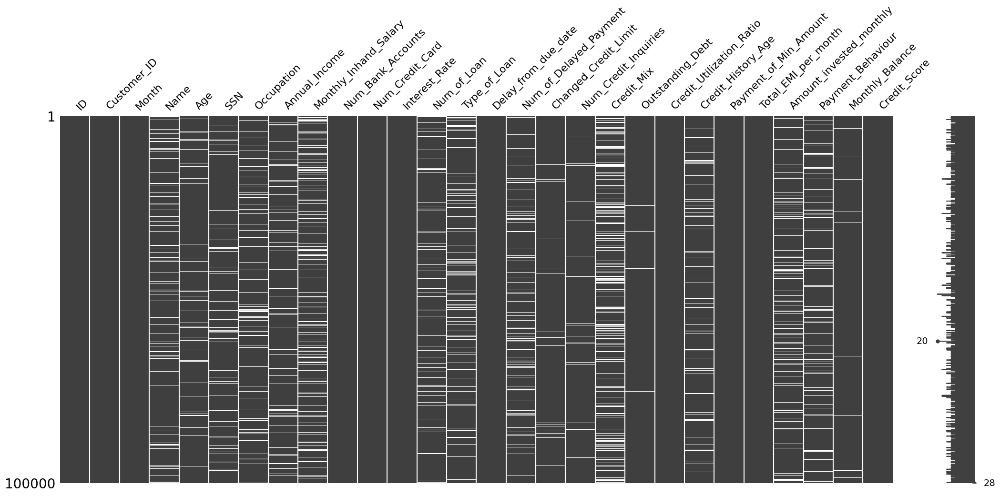

In [156]:
mso.matrix(data)

¿Pero de cuántos datos faltantes estamos hablando?

In [157]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       94175 non-null   float64
 5   SSN                       94428 non-null   object 
 6   Occupation                92938 non-null   object 
 7   Annual_Income             93020 non-null   float64
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         99979 non-null   float64
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               91339 non-null   float64
 13  Type_of_Loan              88592 non-null   ob

In [158]:
data.isnull().sum(axis=0)

ID                              0
Customer_ID                     0
Month                           0
Name                         9985
Age                          5825
SSN                          5572
Occupation                   7062
Annual_Income                6980
Monthly_Inhand_Salary       15002
Num_Bank_Accounts              21
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                  8661
Type_of_Loan                11408
Delay_from_due_date             0
Num_of_Delayed_Payment      10368
Changed_Credit_Limit         2091
Num_Credit_Inquiries         1965
Credit_Mix                  20195
Outstanding_Debt             1009
Credit_Utilization_Ratio        0
Credit_History_Age           9030
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      8784
Payment_Behaviour            7600
Monthly_Balance              1209
Credit_Score                    0
dtype: int64

Si eliminamos las filas con NaN **perdemos ~75% de las muestras**...

<Axes: >

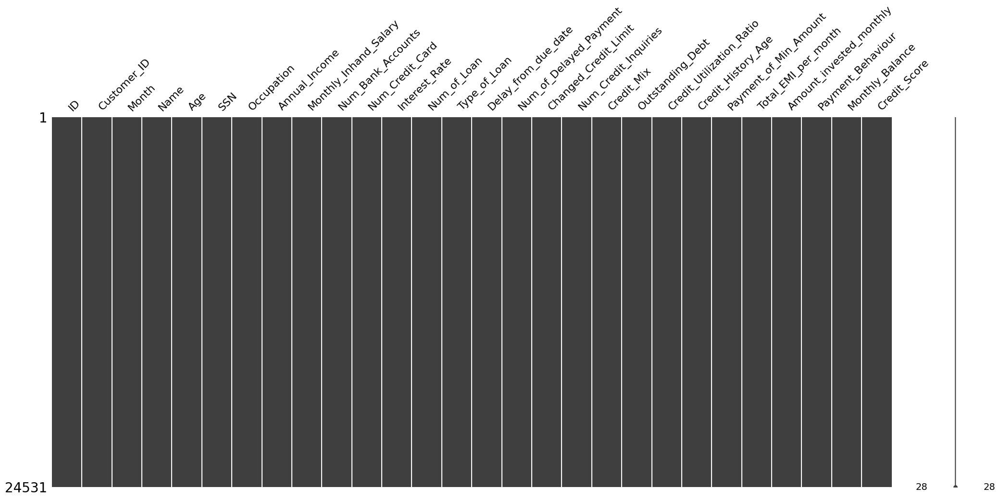

In [159]:
mso.matrix(data.dropna(axis=0, how="any", inplace=False))

Si elliminamos las columnas, **perdemos un ~66% de las características**...

<Axes: >

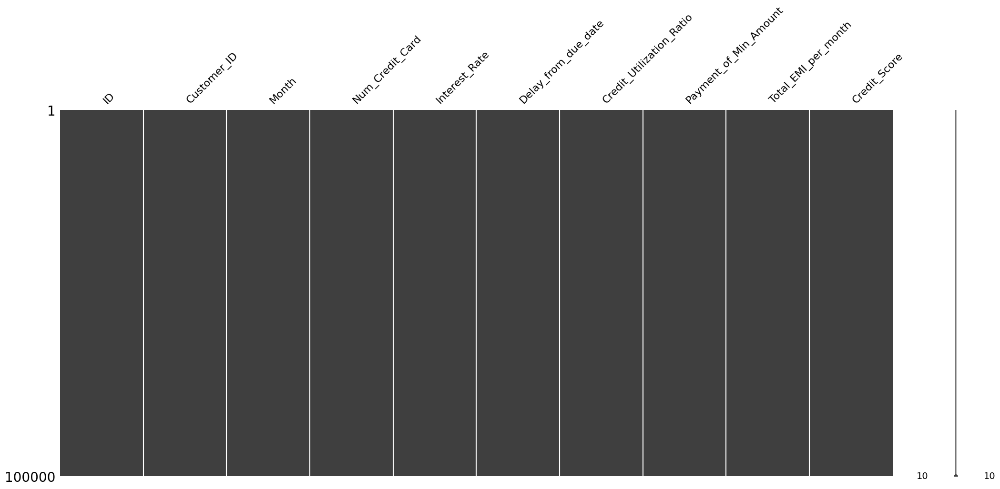

In [160]:
mso.matrix(data.dropna(axis=1, how="any", inplace=False))

No parece, en principio, razonable ir por el camino de la eliminación. Vamos a intentar imputar los datos faltantes.

Tenemos que establecer una estrategia por característica:

- Agrupar por Customer_ID y rellenar
    - Name
    - Age
    - SSN
    - Occupation
    - Annual_Income
    - Monthly_Inhand_Salary
    - Num_Bank_Accounts
    - Num_of_Loan
    - Type_of_Loan
    - Num_Credit_Inquiries
    - Credit_Mix
    - Outstanding_Debt
- Agrupar por Customer_ID y asignar moda
    - Num_of_Delayed_Payment
    - Payment_Behaviour
- Agrupar por Customer_ID y asignar media
    - Changed_Credit_Limit
    - Monthly_Balance
- Agrupar por Customer_ID y asignar mediana.
    - Amount_invested_monthly
- Agrupar por Customer_ID e interpolar
    - Credit_History_Age

Agrupar por Customer_ID y rellenar hacia adelante y hacia atrás

In [161]:
data.loc[
    :,
    [
        "Name",
        "Age",
        "SSN",
        "Occupation",
        "Annual_Income",
        "Monthly_Inhand_Salary",
        "Num_Bank_Accounts",
        "Num_of_Loan",
        "Type_of_Loan",
        "Num_Credit_Inquiries",
        "Credit_Mix",
        "Outstanding_Debt",
    ],
] = (
    data.loc[
        :,
        [
            "Customer_ID",
            "Name",
            "Age",
            "SSN",
            "Occupation",
            "Annual_Income",
            "Monthly_Inhand_Salary",
            "Num_Bank_Accounts",
            "Num_of_Loan",
            "Type_of_Loan",
            "Num_Credit_Inquiries",
            "Credit_Mix",
            "Outstanding_Debt",
        ],
    ]
    .groupby("Customer_ID")
    .ffill()
    .bfill()
)

Agrupar por Customer_ID y asignar moda, media, mediana e interpolar.

In [ ]:
# Moda.

# La función mode() puede devolver más de un valor (en forma de Series)
# si hay empates en la frecuencia, por lo que debemos usar iloc para extraer
# un único valor (por ejemplo, el primero).
data["Num_of_Delayed_Payment"] = data.groupby("Customer_ID")["Num_of_Delayed_Payment"].transform(
    lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else np.nan)
)
data["Payment_Behaviour"] = data.groupby("Customer_ID")["Payment_Behaviour"].transform(
    lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else np.nan)
)

# Media.
data["Changed_Credit_Limit"] = data.groupby("Customer_ID")["Changed_Credit_Limit"].transform(
    lambda x: x.fillna(x.mean())
)
data["Monthly_Balance"] = data.groupby("Customer_ID")["Monthly_Balance"].transform(lambda x: x.fillna(x.mean()))

# Mediana.
data["Amount_invested_monthly"] = data.groupby("Customer_ID")["Amount_invested_monthly"].transform(
    lambda x: x.fillna(x.median())
)

# Interpolación.
data["Credit_History_Age"] = data.groupby("Customer_ID")["Credit_History_Age"].transform(
    lambda x: x.interpolate(method="linear", limit_direction="both")
)

<Axes: >

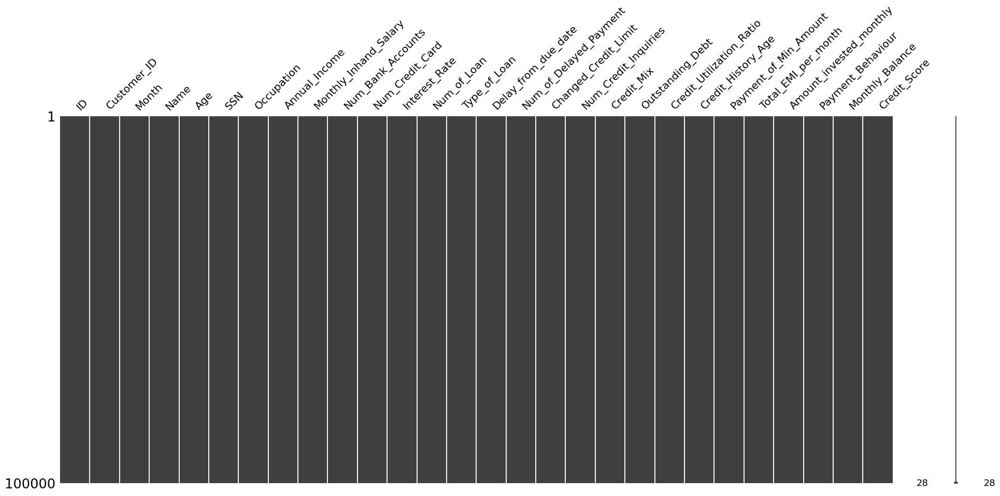

In [163]:
mso.matrix(data)

In [164]:
data.isnull().sum().sum()

np.int64(0)

### Outliers + Distribuciones + Asimetrías

**Outliers** son puntos de datos que se desvían significativamente del resto.

- **Problema**: Distorsionan las estadísticas (media, std), sesgan los modelos (especialmente los basados en distancia o errores cuadrados como regresión lineal, SVM, KNN, K-Means) y no nos gustan porque hacen que se incumplan determinados supuestos (especialmente en el mundo financiero) sobre los que se apoyan los modelos (normalidad o log-normalidad).
- **Detección**:
    - **Regla de 3 Sigmas** (±3 * std ~99% de los datos): Común, pero asume distribución normal o aproximadamente normal y es sensible a los propios outliers (que incrementan la std).
    - **Rango Intercuartílico** (IQR): Más robusto.
    $$Outliers < Q_1 - 1.5 \times IQR$$
    
    $$Outliers > Q_3 + 1.5 \times IQR$$
    
    Donde:
    
    $$IQR = Q_3 - Q_1$$

Ref.:
- https://en.wikipedia.org/wiki/Interquartile_range
- https://www.bachelorprint.com/uk/statistics/interquartile-range/

<div style="text-align: center">
    <img src="./images/preprocesado/Interquartile-range-Definition.jpg" style="width:25%; background-color: white; padding: 10px;">
    <br>
    <img src="./images/preprocesado/Interquartile-range-boxplots.png" style="width:30%">
</div>

- **Visualización**: Box plots, histogramas, scatter plots.
- **Tratamiento**: Investigar. ¿Es un error de datos o un valor extremo genuino? (e.g., el salario del CEO vs. empleados).
    - Si es error: Corregir o tratar como NaN.
    - Si es genuino:
        - Eliminar: Si son pocos y distorsionan mucho, o si el modelo es muy sensible.
        - Transformar: Aplicar transformaciones (log, raíz cuadrada, mediana).
        - Clipping: Limitar los valores extremos a un percentil determinado (e.g., reemplazar todo por encima del P99 con el valor del P99).

- **Usar modelos robustos**: Algoritmos menos sensibles a outliers (e.g., Random Forest, XGBoost).

Variables numéricas

- Age
- Annual_Income
- Monthly_Inhand_Salary
- Num_Bank_Accounts
- Num_Credit_Card
- Interest_Rate
- Num_of_Loan
- Delay_from_due_date
- Num_of_Delayed_Payment
- Changed_Credit_Limit
- Num_Credit_Inquiries
- Outstanding_Debt
- Credit_Utilization_Ratio
- Credit_History_Age
- Total_EMI_per_month
- Amount_invested_monthly
- Monthly_Balance

In [165]:
data.describe()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,100000.000000,1.000000e+05,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,116.880560,1.785063e+05,4198.771619,17.091490,22.47443,72.466040,7.162130,21.068780,29.312610,10.388537,27.700090,1426.220376,32.285173,6732.520565,1403.118217,193.686347,403.120320
std,690.585393,1.440261e+06,3187.494355,117.404803,129.05741,466.422621,60.091195,14.860104,215.683954,6.784097,192.889529,1155.129026,5.116875,3034.001611,8306.041270,194.785222,214.014558
min,14.000000,7.005930e+03,303.645417,0.000000,0.00000,1.000000,0.000000,-5.000000,0.000000,-6.490000,0.000000,0.230000,20.000000,30.000000,0.000000,0.000000,0.007760
25%,25.000000,1.945750e+04,1626.761667,3.000000,4.00000,8.000000,2.000000,10.000000,9.000000,5.340000,3.000000,566.072500,28.052567,4383.000000,30.306660,73.730625,270.189030
50%,33.000000,3.757861e+04,3096.378333,6.000000,5.00000,13.000000,3.000000,18.000000,14.000000,9.400000,6.000000,1166.155000,32.305784,6665.500000,69.249473,129.361839,337.114461
75%,42.000000,7.281486e+04,5961.745000,7.000000,7.00000,20.000000,5.000000,28.000000,18.000000,14.850000,9.000000,1945.962500,36.496663,9192.000000,161.224249,234.346249,471.570652
max,8698.000000,2.419806e+07,15204.633333,1798.000000,1499.00000,5797.000000,1496.000000,67.000000,4397.000000,36.970000,2597.000000,4998.070000,50.000000,12296.000000,82331.000000,1977.326102,1602.040519


Vamos a echar un vistazo a sus distribuciones y relaciones dos a dos

In [166]:
numeric_features = [
    "Age",
    "Annual_Income",
    "Monthly_Inhand_Salary",
    "Num_Bank_Accounts",
    "Num_Credit_Card",
    "Interest_Rate",
    "Num_of_Loan",
    "Delay_from_due_date",
    "Num_of_Delayed_Payment",
    "Changed_Credit_Limit",
    "Num_Credit_Inquiries",
    "Outstanding_Debt",
    "Credit_Utilization_Ratio",
    "Credit_History_Age",
    "Total_EMI_per_month",
    "Amount_invested_monthly",
    "Monthly_Balance",
]

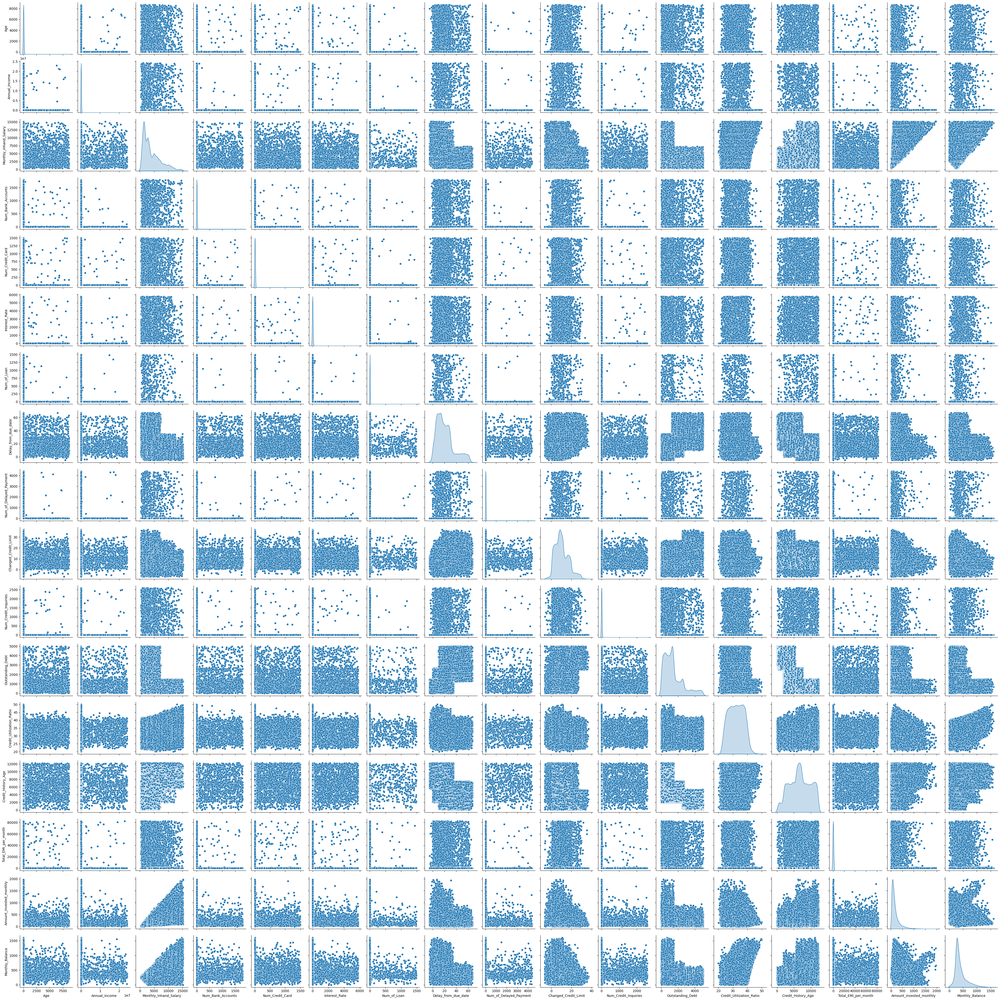

In [96]:
sns.pairplot(data.loc[:, numeric_features], diag_kind="kde")
plt.show()

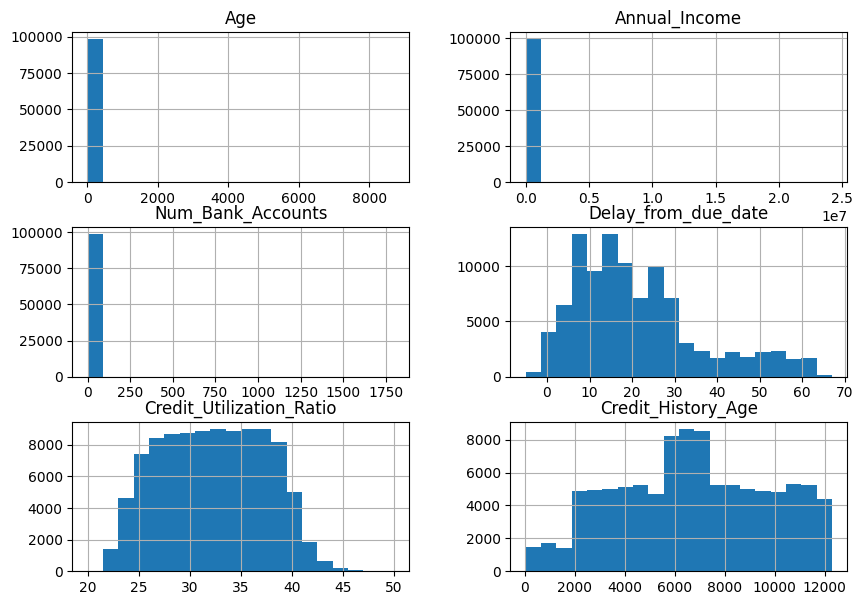

In [167]:
data.loc[
    :,
    [
        "Age",
        "Annual_Income",
        "Num_Bank_Accounts",
        "Delay_from_due_date",
        "Credit_Utilization_Ratio",
        "Credit_History_Age",
    ],
].hist(figsize=(10, 7), bins=20)
plt.show()

Calculamos Skewness

In [168]:
numeric_features = data.describe().columns

In [169]:
data.loc[:, numeric_features].skew()

Age                          9.205135
Annual_Income               12.391367
Monthly_Inhand_Salary        1.128520
Num_Bank_Accounts           11.202486
Num_Credit_Card              8.458017
Interest_Rate                9.006015
Num_of_Loan                 18.615480
Delay_from_due_date          0.966395
Num_of_Delayed_Payment      15.039176
Changed_Credit_Limit         0.642085
Num_Credit_Inquiries         9.796319
Outstanding_Debt             1.207536
Credit_Utilization_Ratio     0.028617
Credit_History_Age          -0.048839
Total_EMI_per_month          7.102524
Amount_invested_monthly      2.586764
Monthly_Balance              1.586748
dtype: float64

Tratamiento de outliers

In [170]:
def get_skewness(df: pd.DataFrame, lower: float = None, upper: float = None) -> tuple:
    """Calcula la asimetría de las columnas numéricas de un DataFrame y las clasifica en altamente sesgadas y poco sesgadas.

    Args:
        df (pd.DataFrame): DataFrame a analizar.
        lower (float, optional): Umbral inferir de sesgo. Defaults to None.
        upper (float, optional): Umbral superior de sesgo. Defaults to None.

    Returns:
        tuple: Devuelve dos listas de índices: una para las columnas altamente sesgadas y otra para las poco sesgadas.
    """
    columns = df.columns
    skewness = df[columns].skew()
    highly_skewed = skewness[(skewness <= lower) | (skewness >= upper)].index.to_list()
    lowly_skewed = skewness[(skewness > lower) & (skewness < upper)].index.to_list()
    return (highly_skewed, lowly_skewed)


def clip_outliers(
    X: pd.Series,
    lower_quantile: float = 0.25,
    upper_quantile: float = 0.75,
    multiply_by: float = 1.5,
    replace_with_median: bool = False,
):
    # Calculamos los límites inferior y superior del rango intercuartílico (IQR).
    q1, q3 = np.quantile(X, [lower_quantile, upper_quantile])
    iqr = q3 - q1
    lower_limit = q1 - (multiply_by * iqr)
    upper_limit = q3 + (multiply_by * iqr)

    # Transformamos los valores.
    if replace_with_median:
        # Valores dentro del intervalo no se tocan.
        # Valores fuera del intervalo se reemplazan con mediana (menos sensible a outliers).
        return np.where(((X >= lower_limit) & (X <= upper_limit)), X, np.median(X))
    else:
        # Los valores fuera del intervalo se reemplazan por el valor mínimo o máximo del intervalo.
        # Los valores dentro del intervalo no se tocan.
        return np.clip(X, a_min=lower_limit, a_max=upper_limit)

In [ ]:
skew_lower_limit = -0.8
skew_upper_limit = 0.8
q1 = 0.25
q3 = 0.75

# Obtenemos los índices de las columnas altamente sesgadas y poco sesgadas.
highly_skewed, lowly_skewed = get_skewness(
    data.loc[:, numeric_features], lower=skew_lower_limit, upper=skew_upper_limit
)

# Transformamos las columnas altamente sesgadas reemplazando los valores atípicos por la mediana.
data[highly_skewed] = data[highly_skewed].apply(
    lambda x: clip_outliers(x, lower_quantile=q1, upper_quantile=q3, multiply_by=1.5, replace_with_median=True)
)
# Transformamos las columnas poco sesgadas reemplazando los valores atípicos por los valores en q1 y q3.
data[lowly_skewed] = data[lowly_skewed].apply(
    lambda x: clip_outliers(x, lower_quantile=q1, upper_quantile=q3, multiply_by=1.5, replace_with_median=False)
)

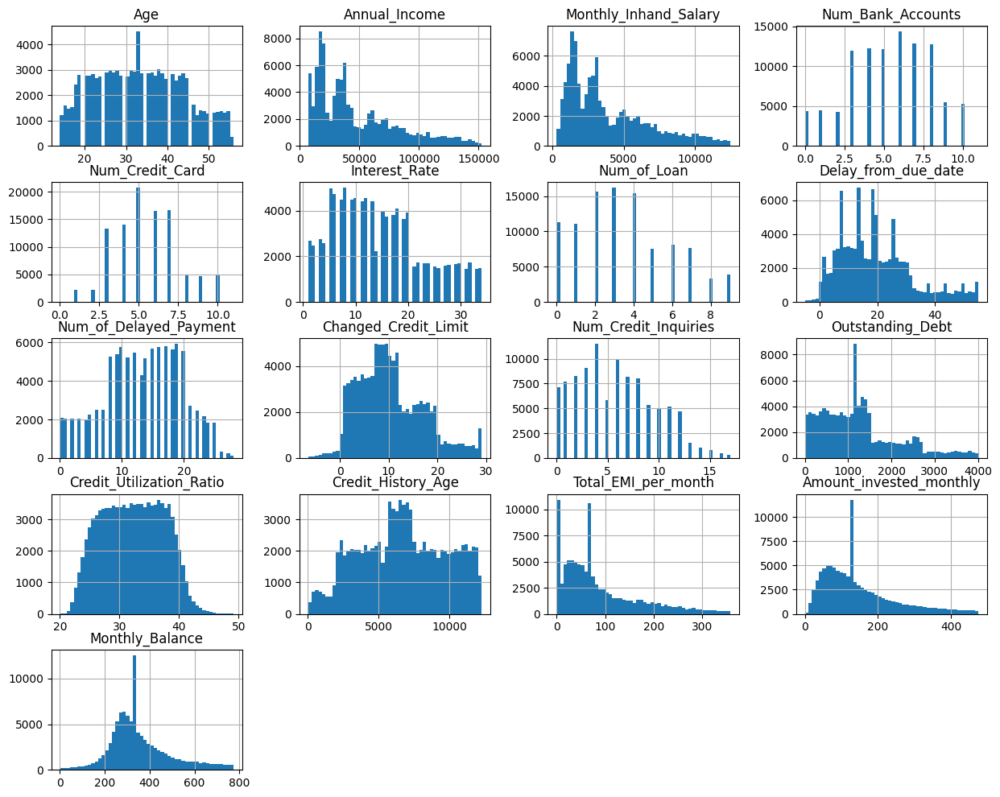

In [172]:
data.loc[
    :,
    numeric_features,
].hist(figsize=(15, 12), bins=50)
plt.show()

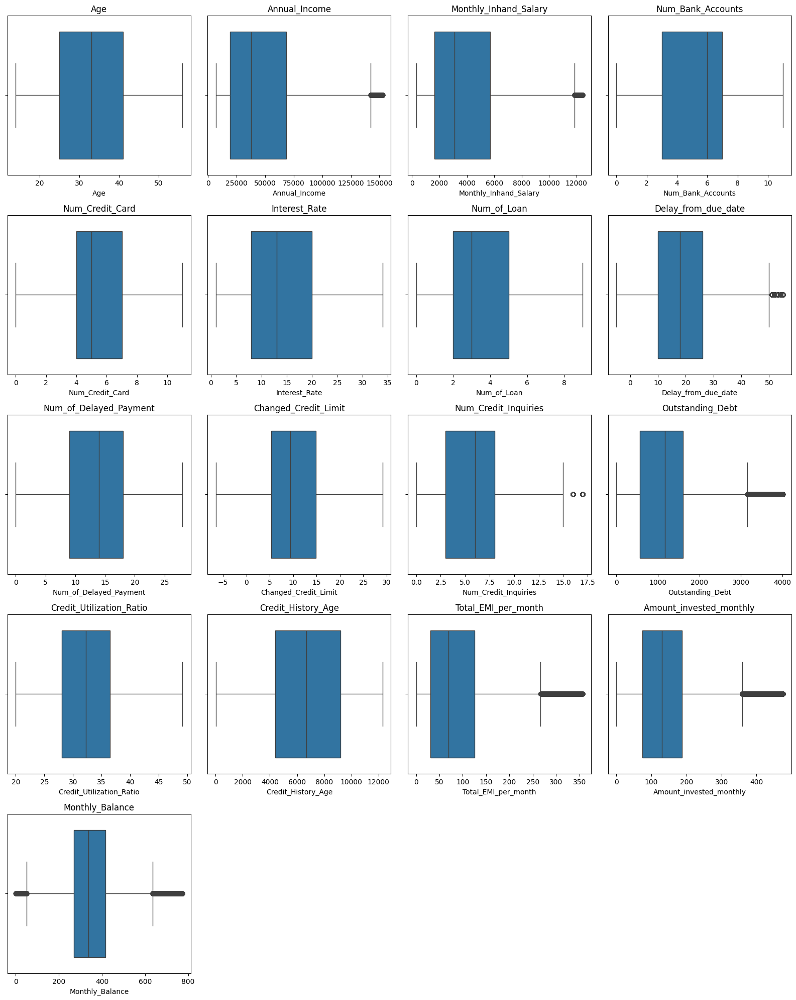

In [173]:
import math

n_features = len(numeric_features)
n_cols = 4
n_rows = math.ceil(n_features / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
axes = axes.flatten()

for i, feature in enumerate(numeric_features):
    sns.boxplot(data=data, x=feature, ax=axes[i])
    axes[i].set_title(f"{feature}")

# Delete empty subplots if any
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### Variables Categóricas

* Valores nominales: no siguen un orden específico, por lo tanto, codificarlas como 1, 2, 3... sería incorrecto.
* Valores ordinales: siguen un orden lógico.

**One-Hot Encoding**

Consiste en crear una nueva columna binaria (0/1) por cada categoría única, consiguiendo que cada categoría sea equidistante con los demás.

<div style="text-align: center">
    <img src="./images/preprocesado/one-hot-encoding.png" style="width:50%">
</div>

Consideraciones:
- **Dimensionalidad**: Si hay muchas categorías (e.g., códigos postales), esto crea muchas columnas nuevas ("Curse of Dimensionality"). Se pueden usar otras técnicas (e.g. hashing trick).
- **Multicolinealidad**: Cuando una característica se puede deducir a partir de otra u otras (e.g. alta correlación o combinación lineal una de otras). A menudo se elimina una columna dummy (``drop_first=True`` en Pandas o ``drop="first"`` en Sklearn) para evitar problemas.

* Valores nominales: no siguen un orden específico.
    * Occupation: One-Hot-Encoding
    * Type_of_Loan: Drop
    * Payment_of_Min_Amount: One-Hot-Encoding
    * Payment_Behaviour: One-Hot-Encoding
* Valores ordinales: siguen un orden lógico.
    * Month: Ordinal-Encoding
    * Credit_Mix: Ordinal-Encoding

Drop

In [174]:
data.drop(labels=["ID", "Customer_ID", "Name", "SSN", "Type_of_Loan"], axis=1, inplace=True)

One-Hot-Encoding

In [175]:
one_hot_enc_features = [
    "Occupation",
    "Payment_of_Min_Amount",
    "Payment_Behaviour",
]
one_hot_enc = OneHotEncoder(sparse_output=False, drop="first")
one_hot_enc.fit(data[one_hot_enc_features])
df_one_hot_enc = pd.DataFrame(
    data=one_hot_enc.transform(data[one_hot_enc_features]),
    columns=one_hot_enc.get_feature_names_out(one_hot_enc_features),
)
df_one_hot_enc

,Occupation_Architect,Occupation_Developer,Occupation_Doctor,Occupation_Engineer,Occupation_Entrepreneur,Occupation_Journalist,Occupation_Lawyer,Occupation_Manager,Occupation_Mechanic,Occupation_Media_Manager,...,Occupation_Scientist,Occupation_Teacher,Occupation_Writer,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes,Payment_Behaviour_High_spent_Medium_value_payments,Payment_Behaviour_High_spent_Small_value_payments,Payment_Behaviour_Low_spent_Large_value_payments,Payment_Behaviour_Low_spent_Medium_value_payments,Payment_Behaviour_Low_spent_Small_value_payments
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
99996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
99997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
99998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0


In [176]:
one_hot_enc.inverse_transform(df_one_hot_enc)

array([['Scientist', 'No', 'High_spent_Small_value_payments'],
       ['Scientist', 'No', 'Low_spent_Large_value_payments'],
       ['Scientist', 'No', 'Low_spent_Medium_value_payments'],
       ...,
       ['Mechanic', 'No', 'High_spent_Large_value_payments'],
       ['Mechanic', 'No', 'Low_spent_Large_value_payments'],
       ['Mechanic', 'No', 'High_spent_Large_value_payments']],
      shape=(100000, 3), dtype=object)

In [177]:
df_one_hot_enc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 21 columns):
 #   Column                                              Non-Null Count   Dtype  
---  ------                                              --------------   -----  
 0   Occupation_Architect                                100000 non-null  float64
 1   Occupation_Developer                                100000 non-null  float64
 2   Occupation_Doctor                                   100000 non-null  float64
 3   Occupation_Engineer                                 100000 non-null  float64
 4   Occupation_Entrepreneur                             100000 non-null  float64
 5   Occupation_Journalist                               100000 non-null  float64
 6   Occupation_Lawyer                                   100000 non-null  float64
 7   Occupation_Manager                                  100000 non-null  float64
 8   Occupation_Mechanic                                 100000 non-nu

Ordinal-Encoding

In [178]:
ord_enc_features = [
    "Month",
    "Credit_Mix",
]
ordinal_enc = OrdinalEncoder(
    categories=[
        [
            "January",
            "February",
            "March",
            "April",
            "May",
            "June",
            "July",
            "August",
            "September",
            "October",
            "November",
            "December",
        ],
        ["Bad", "Standard", "Good"],
    ]
)
ordinal_enc.fit(data[ord_enc_features])
df_ord_enc = pd.DataFrame(
    data=ordinal_enc.transform(data[ord_enc_features]),
    columns=ordinal_enc.get_feature_names_out(ord_enc_features),
)
df_ord_enc

,Month,Credit_Mix
0,0.0,2.0
1,1.0,2.0
2,2.0,2.0
3,3.0,2.0
4,4.0,2.0
...,...,...
99995,3.0,2.0
99996,4.0,2.0
99997,5.0,2.0
99998,6.0,2.0


In [179]:
ordinal_enc.inverse_transform(df_ord_enc)

array([['January', 'Good'],
       ['February', 'Good'],
       ['March', 'Good'],
       ...,
       ['June', 'Good'],
       ['July', 'Good'],
       ['August', 'Good']], shape=(100000, 2), dtype=object)

In [180]:
df_ord_enc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 2 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Month       100000 non-null  float64
 1   Credit_Mix  100000 non-null  float64
dtypes: float64(2)
memory usage: 1.5 MB


Etiquetas

In [181]:
label_enc = LabelEncoder()
label_enc.fit(data["Credit_Score"])
df_label_enc = pd.DataFrame(
    data=label_enc.transform(data["Credit_Score"]),
    columns=["Credit_Score"],
)
df_label_enc

,Credit_Score
0,0
1,0
2,0
3,0
4,0
...,...
99995,1
99996,1
99997,1
99998,2


In [182]:
label_enc.inverse_transform(df_label_enc.values.squeeze())

array(['Good', 'Good', 'Good', ..., 'Poor', 'Standard', 'Poor'],
      shape=(100000,), dtype=object)

In [183]:
df_label_enc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 1 columns):
 #   Column        Non-Null Count   Dtype
---  ------        --------------   -----
 0   Credit_Score  100000 non-null  int64
dtypes: int64(1)
memory usage: 781.4 KB


Componemos DataFrame con nuevas características, quitando las antiguas, que podremos reconstruir más adelante usando la función ``inverse_transform`` como acabamos de ver.

In [184]:
data.drop(one_hot_enc_features + ord_enc_features + ["Credit_Score"], axis=1, inplace=True)
data = pd.concat([data, df_one_hot_enc, df_ord_enc, df_label_enc], axis=1, join="inner")
data

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,...,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes,Payment_Behaviour_High_spent_Medium_value_payments,Payment_Behaviour_High_spent_Small_value_payments,Payment_Behaviour_Low_spent_Large_value_payments,Payment_Behaviour_Low_spent_Medium_value_payments,Payment_Behaviour_Low_spent_Small_value_payments,Month,Credit_Mix,Credit_Score
0,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,3.0,7.0,11.27,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,0
1,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,-1.0,4.0,11.27,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,2.0,0
2,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,3.0,7.0,10.27,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,2.0,0
3,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,5.0,4.0,6.27,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,2.0,0
4,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,6.0,4.0,11.27,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0,2.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,25.0,39628.99,3359.415833,4.0,6.0,7.0,2.0,23.0,7.0,11.50,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,2.0,1
99996,25.0,39628.99,3359.415833,4.0,6.0,7.0,2.0,18.0,7.0,11.50,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0,2.0,1
99997,25.0,39628.99,3359.415833,4.0,6.0,13.0,2.0,27.0,6.0,11.50,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2.0,1
99998,25.0,39628.99,3359.415833,4.0,6.0,7.0,2.0,20.0,6.0,11.50,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,6.0,2.0,2


In [185]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 41 columns):
 #   Column                                              Non-Null Count   Dtype  
---  ------                                              --------------   -----  
 0   Age                                                 100000 non-null  float64
 1   Annual_Income                                       100000 non-null  float64
 2   Monthly_Inhand_Salary                               100000 non-null  float64
 3   Num_Bank_Accounts                                   100000 non-null  float64
 4   Num_Credit_Card                                     100000 non-null  float64
 5   Interest_Rate                                       100000 non-null  float64
 6   Num_of_Loan                                         100000 non-null  float64
 7   Delay_from_due_date                                 100000 non-null  float64
 8   Num_of_Delayed_Payment                              100000 non-nu

### Falsos Predictores

- **Data Leakage (Fuga de Datos)**: Introduccir información en el proceso de entrenamiento que no estará disponible en el momento de la predicción real.
    - Incluir **información del futuro** (e.g., introducir el valor de una característica de mañana para prededir el valor de mañana de la misma u otra relacionada).
    - Incluir variables que son consecuencia directa o **proxy de la variable objetivo** (e.g., incluir una variable que es combinación lineal de la salida).
    - **Errores en preprocesado** (e.g., calcular media/std de todo el dataset antes de dividir en train/test y luego usar estos datos para escalar las variables).
- **La Pregunta Clave**: "¿Tendré esta información disponible exactamente de la misma forma cuando necesite hacer una predicción en producción?" Si la respuesta es NO, esa variable es un falso predictor y debe eliminarse.
- **Consecuencia**: Modelos con rendimiento espectacular en evaluación pero inútiles en la práctica.

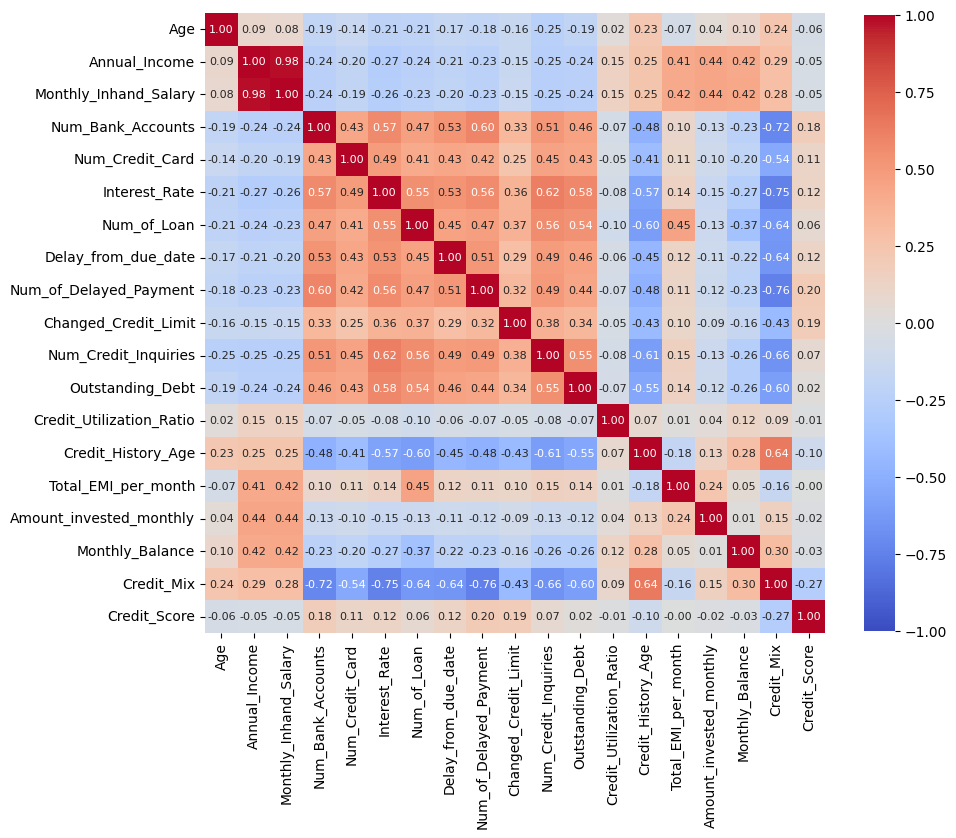

In [186]:
corr_features = [
    "Age",
    "Annual_Income",
    "Monthly_Inhand_Salary",
    "Num_Bank_Accounts",
    "Num_Credit_Card",
    "Interest_Rate",
    "Num_of_Loan",
    "Delay_from_due_date",
    "Num_of_Delayed_Payment",
    "Changed_Credit_Limit",
    "Num_Credit_Inquiries",
    "Outstanding_Debt",
    "Credit_Utilization_Ratio",
    "Credit_History_Age",
    "Total_EMI_per_month",
    "Amount_invested_monthly",
    "Monthly_Balance",
    # "Occupation_Architect",
    # "Occupation_Developer",
    # "Occupation_Doctor",
    # "Occupation_Engineer",
    # "Occupation_Entrepreneur",
    # "Occupation_Journalist",
    # "Occupation_Lawyer",
    # "Occupation_Manager",
    # "Occupation_Mechanic",
    # "Occupation_Media_Manager",
    # "Occupation_Musician",
    # "Occupation_Scientist",
    # "Occupation_Teacher",
    # "Occupation_Writer",
    # "Payment_of_Min_Amount_No",
    # "Payment_of_Min_Amount_Yes",
    # "Payment_Behaviour_High_spent_Medium_value_payments",
    # "Payment_Behaviour_High_spent_Small_value_payments",
    # "Payment_Behaviour_Low_spent_Large_value_payments",
    # "Payment_Behaviour_Low_spent_Medium_value_payments",
    # "Payment_Behaviour_Low_spent_Small_value_payments",
    # "Month",
    "Credit_Mix",
    "Credit_Score",
]
plt.figure(figsize=(10, 10))
sns.heatmap(
    data.loc[:, corr_features].corr(),
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    square=True,
    vmin=-1,
    vmax=1,
    annot_kws={"fontsize": 8},
    cbar_kws={"shrink": 0.8},
)
plt.show()

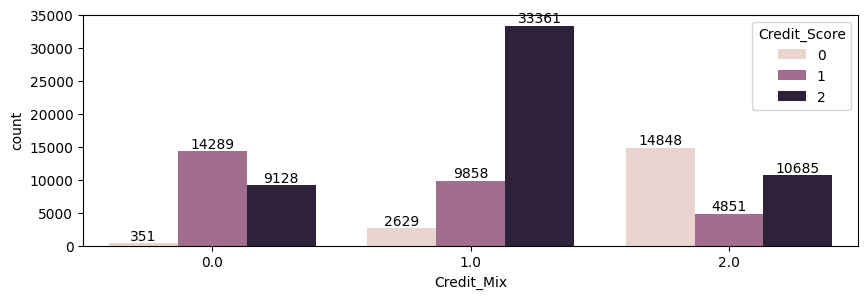

In [187]:
plt.figure(figsize=(10, 3))
ax = sns.countplot(data=data, x="Credit_Mix", hue="Credit_Score")
for container in ax.containers:
    ax.bar_label(container)
plt.show()

### Desbalanceo de Clases

Una clase (o más) está desbalanceada cuando es **significativamente menos frecuente** que otras (e.g., 99% no fraude, 1% fraude).

**Problema**

- Los modelos tienden a favorecer la clase mayoritaria.
- La métrica de accuracy puede ser engañosa (un modelo que siempre predice "no fraude" tendría 99% accuracy pero sería inútil).
- La clase minoritaria suele ser la de interés.

**¿Qué hacemos?**

- **Oversampling**: Aumentar la clase minoritaria.
    - Simple: Repetir muestras minoritarias. Riesgo: Overfitting.
    - Avanzado: SMOTE (Synthetic Minority Over-sampling Technique), que genera muestras sintéticas creando puntos entre muestras minoritarias existentes y sus vecinos; o ADASYN (Adaptive Synthetic), que parte de SMOTE y genera más datos sintéticos alrededor de los ejemplos minoritarios y menos donde la separación ya es clara. Generalmente preferido a la simple repetición.
- **Undersampling**: Reducir la clase mayoritaria.
    - Simple: Eliminar aleatoriamente muestras mayoritarias. Riesgo: Pérdida de información útil.
    - Avanzado: Métodos que eliminan muestras mayoritarias redundantes o lejanas a la frontera de decisión (e.g., NearMiss, Edited - Nearest Neighbours).
- Otras Estrategias:
    - **Métricas Adecuadas**: Usar Balanced Accuracy, Precision, Recall, F1-Score, AUC-ROC, Precision-Recall Curve, Matthews Correlation Coefficient en lugar de Accuracy.
    - **Función de Coste Adecuada**: Asignar un coste mayor a los errores en la clase minoritaria durante el entrenamiento.
    - **Ensembles**: Usar algoritmos de ensemble que manejan el desbalanceo internamente.

**¡Importante!**
- Al dividir los datos en train/test/validación se debe tener en cuenta la proporción de las etiquetas, de modo que se mantenga esta proporción lo más posible entre los conjuntos (e.g., para problemas multi-etiqueta existe la librería scikit-multilearn, construida sobre scikit-learn).
- Aplicar over/undersampling **SOLO al conjunto de entrenamiento**, después de dividir los datos. **NUNCA a los conjuntos de test/validación**.

In [188]:
label_enc.classes_

array(['Good', 'Poor', 'Standard'], dtype=object)

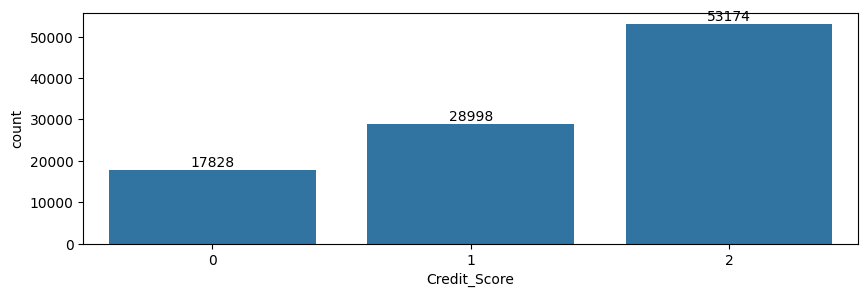

Credit_Score
2    0.53174
1    0.28998
0    0.17828
Name: count, dtype: float64

In [189]:
plt.figure(figsize=(10, 3))
ax = sns.countplot(data=data, x="Credit_Score")
ax.bar_label(ax.containers[0])
plt.show()

data.loc[:, "Credit_Score"].value_counts() / data.shape[0]

In [120]:
features = list(data.columns)[:-1]
target = data.columns[-1]

In [121]:
from collections import Counter

X = data.loc[:, features]
y = data.loc[:, target]

print(sorted(Counter(y).items()))

[(0, 17828), (1, 28998), (2, 53174)]


In [122]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=42, stratify=y)

print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

print("---- Proporción de etiquetas en Train")
print(y_train.value_counts() / y_train.shape[0])
print("---- Proporción de etiquetas en Test")
print(y_test.value_counts() / y_test.shape[0])

(80000, 40) (20000, 40) (80000,) (20000,)
---- Proporción de etiquetas en Train
Credit_Score
2    0.531737
1    0.289988
0    0.178275
Name: count, dtype: float64
---- Proporción de etiquetas en Test
Credit_Score
2    0.53175
1    0.28995
0    0.17830
Name: count, dtype: float64


In [123]:
from imblearn.over_sampling import SMOTE

X_resampled, y_resampled = SMOTE().fit_resample(X_train, y_train)
print(sorted(Counter(y_resampled).items()))

print("---- Proporción de etiquetas en Train")
print(y_resampled.value_counts() / y_resampled.shape[0])

[(0, 42539), (1, 42539), (2, 42539)]
---- Proporción de etiquetas en Train
Credit_Score
2    0.333333
1    0.333333
0    0.333333
Name: count, dtype: float64


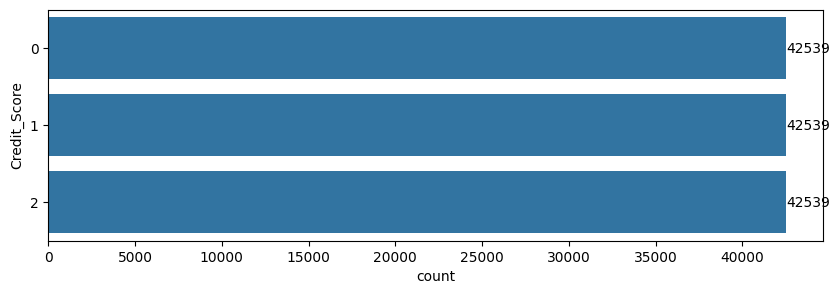

In [124]:
plt.figure(figsize=(10, 3))
ax = sns.countplot(y=y_resampled)
ax.bar_label(ax.containers[0])
plt.show()

In [125]:
from imblearn.over_sampling import ADASYN

X_resampled, y_resampled = ADASYN().fit_resample(X_train, y_train)
print(sorted(Counter(y_resampled).items()))

print("---- Proporción de etiquetas en Train")
print(y_resampled.value_counts() / y_resampled.shape[0])

[(0, 40516), (1, 45059), (2, 42539)]
---- Proporción de etiquetas en Train
Credit_Score
1    0.35171
2    0.33204
0    0.31625
Name: count, dtype: float64


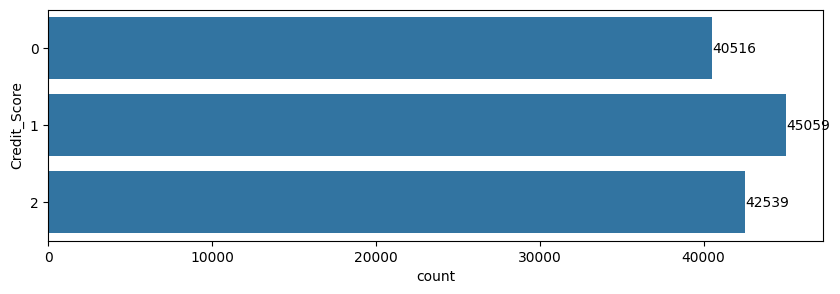

In [126]:
plt.figure(figsize=(10, 3))
ax = sns.countplot(y=y_resampled)
ax.bar_label(ax.containers[0])
plt.show()

### Estandarización (Z-Score Scaling)

Como ya hemos visto, los algoritmos basados en distancias (KNN, SVM, K-Means), pero también los basados en gradientes (Regresión Lineal/Logística, Redes Neuronales) o varianza (PCA) son sensibles a la escala de las características. Una característica con rango [0, 1000] dominará sobre una con rango [0, 1].

El objetivo de la estandarización es transformar los datos para que tengan media 0 y desviación estándar 1.

$$X_{norm} = \frac{X - \mu}{\sigma}$$

Donde $\mu$ es la media y $\sigma$ es la desviación estándar de la característica en el **conjunto de entrenamiento**.

Características
- No limita el rango de valores (pueden ser >1 o <-1).
- Tiende a funcionar bien en la mayoría de los casos.
- Menos sensible a outliers que Min-Max Scaling.

In [127]:
# Creamos el escalador.
std_scaler = StandardScaler(copy=True, with_mean=True, with_std=True)

# Entrenamos y transformamos con conjunto de TRAIN con oversampling.
X_resampled_numeric_std = std_scaler.fit_transform(X_resampled.loc[:, numeric_features])
# Transformamos el conjunto de TEST.
X_test_numeric_std = std_scaler.transform(X_test.loc[:, numeric_features])

# Sustituimos valores transformados.
X_resampled_std = X_resampled.copy()
X_resampled_std.loc[:, numeric_features] = X_resampled_numeric_std

X_test_std = X_test.copy()
X_test_std.loc[:, numeric_features] = X_test_numeric_std

# Comprobamos estadísticas de TEST.
X_test_std.describe()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,...,Occupation_Writer,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes,Payment_Behaviour_High_spent_Medium_value_payments,Payment_Behaviour_High_spent_Small_value_payments,Payment_Behaviour_Low_spent_Large_value_payments,Payment_Behaviour_Low_spent_Medium_value_payments,Payment_Behaviour_Low_spent_Small_value_payments,Month,Credit_Mix
count,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,...,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.00000
mean,-0.018196,-0.032084,-0.031506,0.070560,0.052890,0.057375,0.046485,0.045227,0.075538,0.065622,...,0.063250,0.357900,0.523450,0.192750,0.121050,0.11100,0.146200,0.273700,3.487200,1.06835
std,1.025106,0.970980,0.971569,0.992352,0.997844,0.999130,1.018579,1.007386,0.985397,1.039977,...,0.243418,0.479394,0.499462,0.394468,0.326194,0.31414,0.353315,0.445868,2.286941,0.73342
min,-1.877035,-1.187279,-1.281911,-1.992230,-2.652891,-1.495852,-1.435832,-1.899562,-2.027524,-2.518508,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000
25%,-0.820546,-0.834310,-0.829921,-0.838426,-0.695814,-0.688475,-0.598684,-0.700566,-0.605159,-0.717030,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1.000000,1.00000
50%,-0.052191,-0.330824,-0.337155,0.315378,-0.206545,-0.111777,-0.180110,-0.061100,0.185044,-0.084825,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.00000,0.000000,0.000000,3.000000,1.00000
75%,0.716164,0.548215,0.557647,0.699979,0.771993,0.695601,0.657038,0.578365,0.817206,0.756070,...,0.000000,1.000000,1.000000,0.000000,0.000000,0.00000,0.000000,1.000000,5.000000,2.00000
max,2.156830,2.896867,2.830914,2.238384,2.729070,2.310355,2.331334,2.896425,2.397612,2.943470,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,7.000000,2.00000


In [128]:
X_resampled_std.columns

Index(['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
       'Credit_History_Age', 'Total_EMI_per_month', 'Amount_invested_monthly',
       'Monthly_Balance', 'Occupation_Architect', 'Occupation_Developer',
       'Occupation_Doctor', 'Occupation_Engineer', 'Occupation_Entrepreneur',
       'Occupation_Journalist', 'Occupation_Lawyer', 'Occupation_Manager',
       'Occupation_Mechanic', 'Occupation_Media_Manager',
       'Occupation_Musician', 'Occupation_Scientist', 'Occupation_Teacher',
       'Occupation_Writer', 'Payment_of_Min_Amount_No',
       'Payment_of_Min_Amount_Yes',
       'Payment_Behaviour_High_spent_Medium_value_payments',
       'Payment_Behaviour_High_spent_Small_value_payments',
       'Payment_Behaviour_Low_spent_Large_value_payme

In [129]:
X_test_std.columns

Index(['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
       'Credit_History_Age', 'Total_EMI_per_month', 'Amount_invested_monthly',
       'Monthly_Balance', 'Occupation_Architect', 'Occupation_Developer',
       'Occupation_Doctor', 'Occupation_Engineer', 'Occupation_Entrepreneur',
       'Occupation_Journalist', 'Occupation_Lawyer', 'Occupation_Manager',
       'Occupation_Mechanic', 'Occupation_Media_Manager',
       'Occupation_Musician', 'Occupation_Scientist', 'Occupation_Teacher',
       'Occupation_Writer', 'Payment_of_Min_Amount_No',
       'Payment_of_Min_Amount_Yes',
       'Payment_Behaviour_High_spent_Medium_value_payments',
       'Payment_Behaviour_High_spent_Small_value_payments',
       'Payment_Behaviour_Low_spent_Large_value_payme

### Normalización (Min-Max Scaling)

El objetivo de la normalización es transformar los datos a un rango fijo, típicamente [0, 1].

La fórmula para el intervalo [0, 1]:

$$X_{scaled} = \frac{X - min}{max - min}$$

Donde $min$ y $max$ son los valores mínimo y máximo de la característica en el **conjunto de entrenamiento**.

La fórmula general para el intervalo [a, b]:

$$X_{scaled} = a+(b-a)\frac{X - min}{max - min}$$

Características

- Útil cuando se requiere un rango acotado (e.g., intensidades de píxeles, entradas a ciertas redes neuronales).
- Muy sensible a outliers: un valor extremo puede comprimir todo el resto de los datos en un rango muy pequeño.

**Estandarización vs. Min-Max**: No hay una regla de oro. Estandarización es a menudo un buen punto de partida. Min-Max puede ser útil si el algoritmo lo requiere o si los datos no tienen outliers significativos.

In [130]:
# Creamos el escalador.
minmax_scaler = MinMaxScaler(feature_range=(0, 1), copy=True, clip=False)

# Entrenamos y transformamos con conjunto de TRAIN con oversampling.
X_resampled_numeric_minmax = minmax_scaler.fit_transform(X_resampled.loc[:, numeric_features])
# Transformamos el conjunto de TEST.
X_test_numeric_minmax = minmax_scaler.transform(X_test.loc[:, numeric_features])

# Sustituimos valores transformados.
X_resampled_minmax = X_resampled.copy()
X_resampled_minmax.loc[:, numeric_features] = X_resampled_numeric_minmax

X_test_minmax = X_test.copy()
X_test_minmax.loc[:, numeric_features] = X_test_numeric_minmax

# Comprobamos estadísticas de TEST.
X_test_minmax.describe()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,...,Occupation_Writer,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes,Payment_Behaviour_High_spent_Medium_value_payments,Payment_Behaviour_High_spent_Small_value_payments,Payment_Behaviour_Low_spent_Large_value_payments,Payment_Behaviour_Low_spent_Medium_value_payments,Payment_Behaviour_Low_spent_Small_value_payments,Month,Credit_Mix
count,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,...,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.00000
mean,0.460808,0.282849,0.304026,0.487586,0.502750,0.408077,0.393483,0.405503,0.475254,0.473260,...,0.063250,0.357900,0.523450,0.192750,0.121050,0.11100,0.146200,0.273700,3.487200,1.06835
std,0.254125,0.237744,0.236229,0.234565,0.185405,0.262500,0.270384,0.210048,0.222682,0.190350,...,0.243418,0.479394,0.499462,0.394468,0.326194,0.31414,0.353315,0.445868,2.286941,0.73342
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000281,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000
25%,0.261905,0.086424,0.109898,0.272727,0.363636,0.212121,0.222222,0.250000,0.321429,0.330010,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1.000000,1.00000
50%,0.452381,0.209702,0.229710,0.545455,0.454545,0.363636,0.333333,0.383333,0.500000,0.445724,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.00000,0.000000,0.000000,3.000000,1.00000
75%,0.642857,0.424934,0.447274,0.636364,0.636364,0.575758,0.555556,0.516667,0.642857,0.599635,...,0.000000,1.000000,1.000000,0.000000,0.000000,0.00000,0.000000,1.000000,5.000000,2.00000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,7.000000,2.00000


### Logaritmo (Log Transform)

Contenido: Muestra cómo la transformación logarítmica puede normalizar distribuciones log-normales (muy sesgadas a la derecha).

Notas para el Profesor:

Problema: Muchas variables del mundo real (ingresos, precios, recuentos) tienen distribuciones muy sesgadas a la derecha (right-skewed). Algunos modelos (especialmente los lineales) funcionan mejor o sus supuestos se cumplen mejor con distribuciones más simétricas (cercanas a la normal).

Transformación Logarítmica (log(X)):

Efecto: Comprime los valores grandes y expande los pequeños, reduciendo el sesgo a la derecha.

Usar los histogramas: Mostrar cómo la distribución original 'X' está concentrada a la izquierda con una cola larga a la derecha, y cómo log(X) se parece mucho más a una campana de Gauss.

Requisito: Funciona solo para valores positivos. Si hay ceros, usar log(X + 1). Si hay negativos, no es aplicable directamente (se pueden necesitar otras transformaciones como Box-Cox o Yeo-Johnson).

Otras transformaciones para sesgo: Raíz cuadrada (sqrt(X)) para sesgo moderado, Box-Cox (requiere datos positivos), Yeo-Johnson (maneja ceros y negativos).

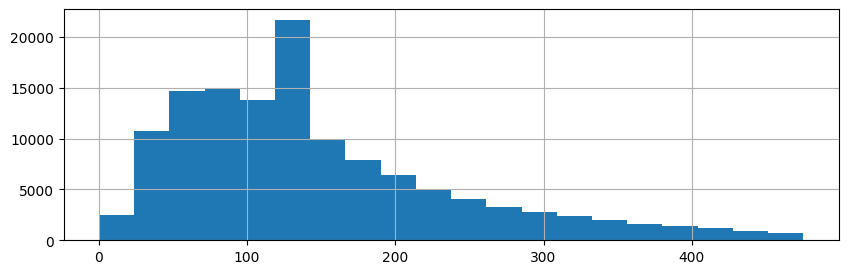

In [131]:
X_resampled.loc[:, "Amount_invested_monthly"].hist(figsize=(10, 3), bins=20)
plt.show()

In [132]:
X_resampled.loc[:, "Amount_invested_monthly"].describe()

count    128114.000000
mean        146.817360
std          94.564805
min           0.000000
25%          77.515629
50%         129.361839
75%         189.967644
max         475.265844
Name: Amount_invested_monthly, dtype: float64

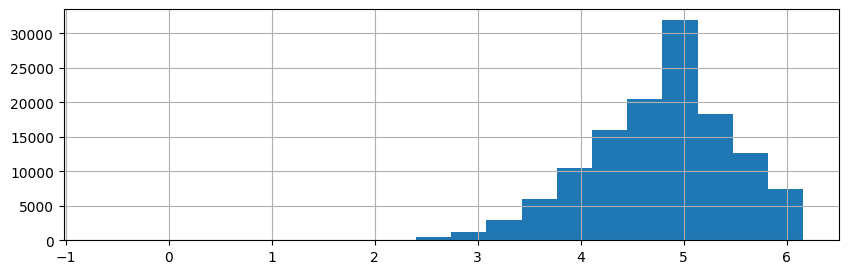

In [ ]:
np.log((X_resampled.loc[X_resampled["Amount_invested_monthly"] > 0, "Amount_invested_monthly"])).hist(
    figsize=(10, 3), bins=20
)
plt.show()

### Otras Distribuciones

**Distribuciones Multimodales**: El histograma muestra claramente dos (o más) picos, sugiriendo que los datos provienen de subpoblaciones distintas.

Estrategia: Clustering como Preprocesado:
- Aplicar un algoritmo de clustering (e.g., K-Means con K=2 para el ejemplo) a los datos antes del modelado supervisado.

¿Cómo usar los resultados del clustering?

- **Nueva Feature Categórica**: Añadir una columna al dataset que indique a qué cluster pertenece cada instancia. El modelo supervisado puede usar esta información.
- **Modelos Separados**: Entrenar un modelo supervisado diferente para cada cluster identificado. Esto puede capturar mejor las relaciones específicas dentro de cada subgrupo.

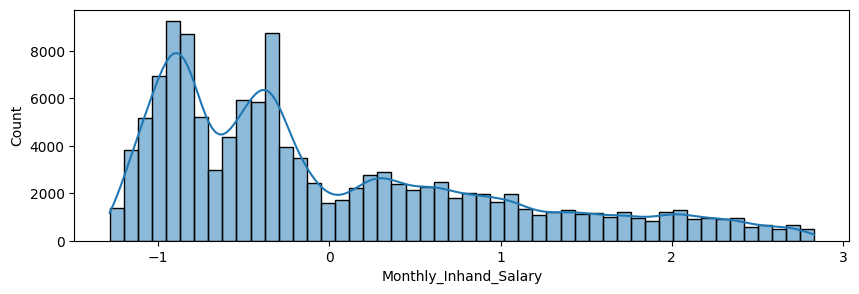

In [134]:
plt.figure(figsize=(10, 3))
sns.histplot(data=X_resampled_std, x="Monthly_Inhand_Salary", bins=50, kde=True)
plt.show()

In [135]:
from sklearn.cluster import KMeans

feature_names = ["Monthly_Inhand_Salary"]
num_clusters = 3
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(X_resampled_std.loc[:, feature_names])
kmeans.labels_

array([0, 0, 1, ..., 0, 0, 0], shape=(128114,), dtype=int32)

In [136]:
print(sorted(Counter(kmeans.labels_).items()))

[(np.int32(0), 18138), (np.int32(1), 77820), (np.int32(2), 32156)]


In [137]:
X_resampled_std[feature_names[0] + "_Cluster"] = kmeans.labels_

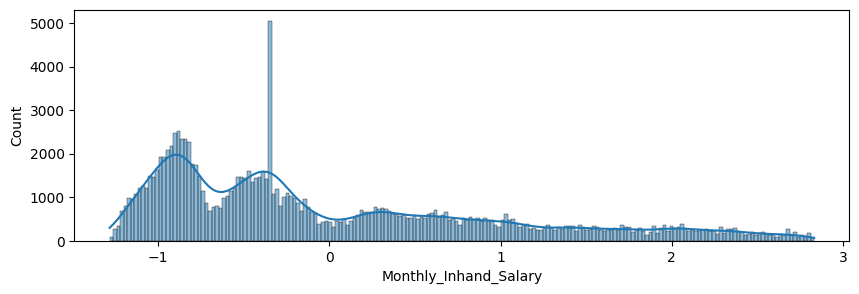

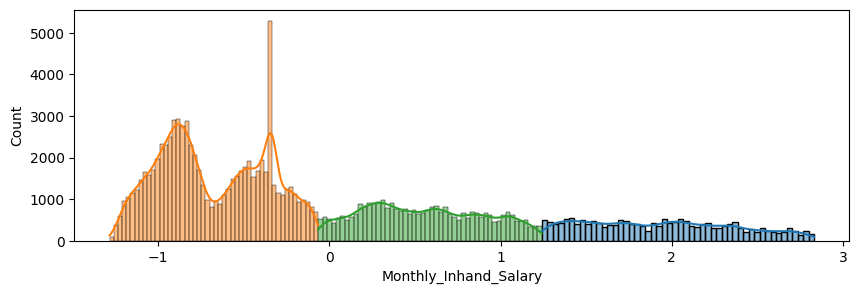

In [138]:
plt.figure(figsize=(10, 3))
sns.histplot(data=X_resampled_std, x=feature_names[0], bins=200, kde=True)
plt.show()

plt.figure(figsize=(10, 3))

for i in range(num_clusters):
    sns.histplot(
        data=X_resampled_std.loc[X_resampled_std[feature_names[0] + "_Cluster"] == i],
        x=feature_names[0],
        bins=50,
        kde=True,
    )
plt.show()

###  Generar Nuevas Características (Feature Engineering)

Es el arte y la ciencia de crear nuevas variables predictoras a partir de las existentes para mejorar el rendimiento del modelo. A menudo es donde se obtiene la mayor ganancia de rendimiento.

- **Conocimiento Experto**: El dominio del negocio es básico para crear características que tengan sentido y sean útiles.

Ejemplos
- **Retornos vs. Precios (Finanzas)**: Los precios de activos suelen tener tendencia y ser no estacionarios (su media y varianza cambian con el tiempo), lo cual no gusta cuando supones normalidad y que las características estadísticas no cambian. Al calcular los retornos logarítmicos eliminas la tendencia. Los retornos financieros suelen considerarse estacionarios en la media.
- **Productividad vs. Nº Clientes/Horas trabajadas (Negocios)**: El número bruto de clientes puede no reflejar el valor. Una métrica de productividad (e.g., ingresos / num_clientes, ventas / horas_trabajadas) puede ser mucho más informativa sobre el rendimiento real.
- **Espectrogramas vs. Audio Crudo (Señales)**: La señal de audio cruda (amplitud vs. tiempo) es compleja. Un espectrograma (intensidad vs. frecuencia vs. tiempo) representa visualmente el contenido frecuencial, facilitando la identificación de patrones (como fonemas en voz, notas en música) a menudo usando modelos de visión por computador (CNNs).

Otros Ejemplos Comunes: Crear interacciones (featureA * featureB), términos polinómicos (featureA^2), binarizar variables continuas (dividir en rangos), extraer partes de fechas (día de la semana, mes, hora), descomposición de señales temporales en sus componentes mediante análisis de Fourier.

Datos del S&P 500 y sus componentes

In [ ]:
asset_price_path = "./dataset/data_comp_sp500.csv"
idx_price_path = "./dataset/data_idx_sp500.csv"

data = pd.read_csv(asset_price_path, parse_dates=True, index_col="Date", dtype=np.float32)
data.dropna(inplace=True, axis=1, thresh=0.8 * data.shape[0])
data.dropna(inplace=True, axis=0, how="any")

data_idx = pd.read_csv(idx_price_path, parse_dates=True, index_col="Date", dtype=np.float32)
data_idx.dropna(inplace=True)

Precios de Apple

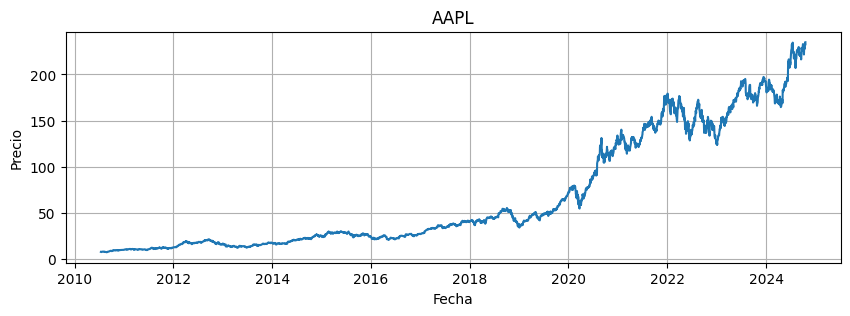

In [140]:
apple = data.loc[:, "AAPL"]

plt.figure(figsize=(10, 3))
plt.plot(apple, label="AAPL")
plt.grid(True)
plt.title("AAPL")
plt.xlabel("Fecha")
plt.ylabel("Precio")
plt.show()

Retornos

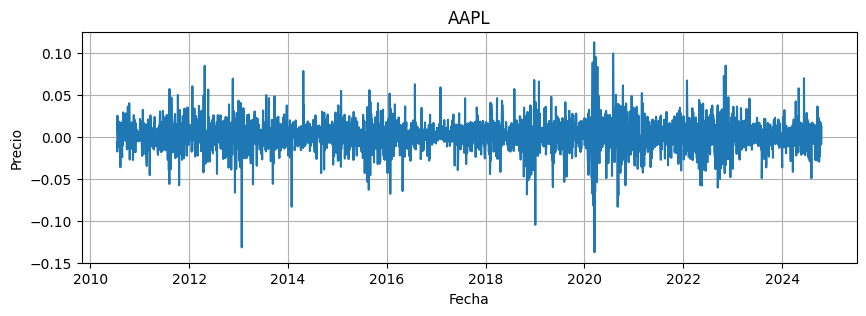

In [141]:
apple_ret = np.log(apple).diff().dropna()

plt.figure(figsize=(10, 3))
plt.plot(apple_ret, label="AAPL")
plt.grid(True)
plt.title("AAPL")
plt.xlabel("Fecha")
plt.ylabel("Precio")
plt.show()

Media de los retornos: 0.0009564306819811463
Desviación estándar de los retornos: 0.017557311803102493


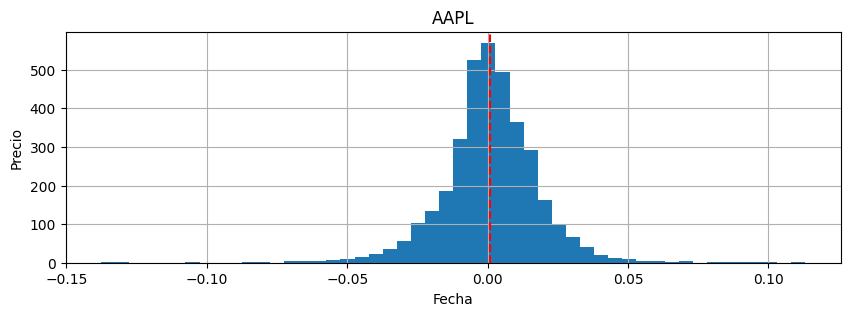

In [142]:
print(f"Media de los retornos: {apple_ret.mean()}")
print(f"Desviación estándar de los retornos: {apple_ret.std()}")

plt.figure(figsize=(10, 3))
apple_ret.plot.hist(bins=50, label="AAPL")
plt.axvline(apple_ret.mean(), color="red", linestyle="--", label="Media")
plt.grid(True)
plt.title("AAPL")
plt.xlabel("Fecha")
plt.ylabel("Precio")
plt.show()

Nuevas características via medias móviles

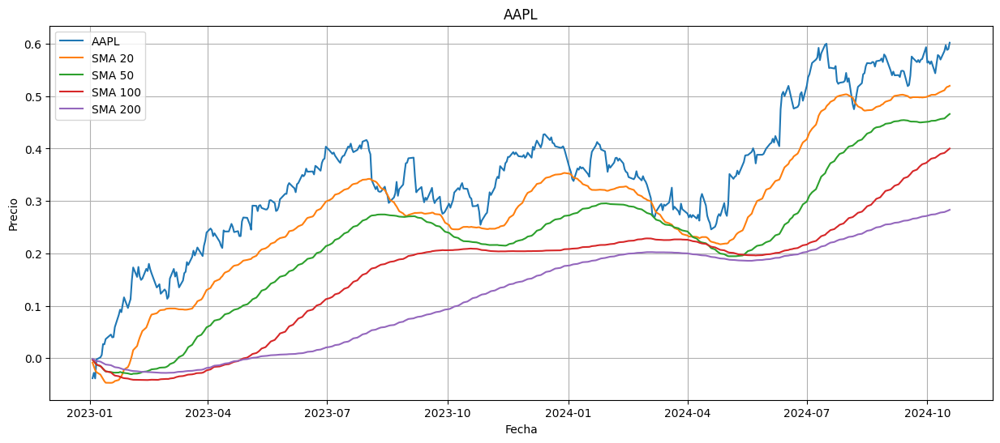

In [143]:
ret_sma_20 = apple_ret.rolling(window=20).mean()
ret_sma_50 = apple_ret.rolling(window=50).mean()
ret_sma_100 = apple_ret.rolling(window=100).mean()
ret_sma_200 = apple_ret.rolling(window=200).mean()

plt.figure(figsize=(15, 6))
plt.plot(apple_ret.loc["2023":"2024"].cumsum(), label="AAPL")
plt.plot(ret_sma_20.loc["2023":"2024"].cumsum(), label="SMA 20")
plt.plot(ret_sma_50.loc["2023":"2024"].cumsum(), label="SMA 50")
plt.plot(ret_sma_100.loc["2023":"2024"].cumsum(), label="SMA 100")
plt.plot(ret_sma_200.loc["2023":"2024"].cumsum(), label="SMA 200")
plt.grid(True)
plt.legend()
plt.title("AAPL")
plt.xlabel("Fecha")
plt.ylabel("Precio")
plt.show()

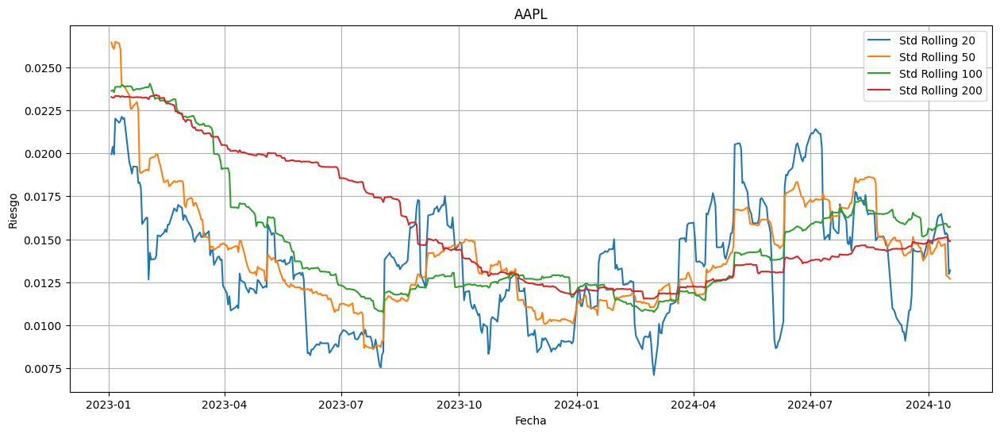

In [144]:
std_rolling_20 = apple_ret.rolling(window=20).std()
std_rolling_50 = apple_ret.rolling(window=50).std()
std_rolling_100 = apple_ret.rolling(window=100).std()
std_rolling_200 = apple_ret.rolling(window=200).std()

plt.figure(figsize=(15, 6))
plt.plot(std_rolling_20.loc["2023":"2024"], label="Std Rolling 20")
plt.plot(std_rolling_50.loc["2023":"2024"], label="Std Rolling 50")
plt.plot(std_rolling_100.loc["2023":"2024"], label="Std Rolling 100")
plt.plot(std_rolling_200.loc["2023":"2024"], label="Std Rolling 200")
plt.grid(True)
plt.legend()
plt.title("AAPL")
plt.xlabel("Fecha")
plt.ylabel("Riesgo")
plt.show()

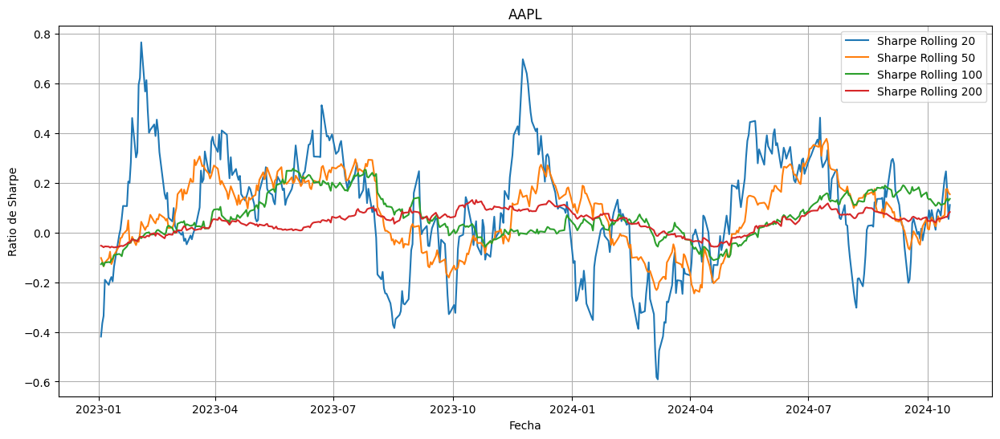

In [145]:
rf = 0.0


def get_sharpe_ratio(returns: pd.Series, rf: float = 0.0) -> float:
    """Calcula el ratio de Sharpe.

    Args:
        returns (pd.Series): Serie de retornos.
        rf (float, optional): Tasa libre de riesgo. Defaults to 0.0.

    Returns:
        float: Ratio de Sharpe.
    """
    return (returns.mean() - rf) / returns.std()


sr_rolling_20 = apple_ret.rolling(window=20).apply(get_sharpe_ratio, raw=False, kwargs={"rf": rf})
sr_rolling_50 = apple_ret.rolling(window=50).apply(get_sharpe_ratio, raw=False, kwargs={"rf": rf})
sr_rolling_100 = apple_ret.rolling(window=100).apply(get_sharpe_ratio, raw=False, kwargs={"rf": rf})
sr_rolling_200 = apple_ret.rolling(window=200).apply(get_sharpe_ratio, raw=False, kwargs={"rf": rf})

plt.figure(figsize=(15, 6))
plt.plot(sr_rolling_20.loc["2023":"2024"], label="Sharpe Rolling 20")
plt.plot(sr_rolling_50.loc["2023":"2024"], label="Sharpe Rolling 50")
plt.plot(sr_rolling_100.loc["2023":"2024"], label="Sharpe Rolling 100")
plt.plot(sr_rolling_200.loc["2023":"2024"], label="Sharpe Rolling 200")
plt.grid(True)
plt.legend()
plt.title("AAPL")
plt.xlabel("Fecha")
plt.ylabel("Ratio de Sharpe")
plt.show()

## Resumen

- **Fases y técnicas**
    - Auditoría (tipos de datos, necesidad de etiquetas)
    - Limpieza (errores, NaNs, outliers)
    - Transformación (encoding, escalado/normalización, logaritmo)
    - Feature Engineering (creación de nuevas variables, manejo de distribuciones complejas, balanceo de clases)
- **Iterativo**
    - El preprocesado no es un proceso lineal. A menudo se vuelve a la auditoría o se prueban diferentes técnicas después de evaluar un primer modelo.
- **Importancia**
    - Reiterar que un preprocesado cuidadoso y bien razonado es fundamental para construir modelos de ML robustos y fiables. Es donde la comprensión de los datos y el - dominio del problema realmente brillan.
- **Próximos Pasos**
    - Una vez los datos están preprocesados, se puede pasar a la selección de características (si es necesario) y al entrenamiento y evaluación de modelos.